In [ ]:
import os
import glob
import json
import random
import subprocess
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
import zipfile
import urllib.request

try:
    import pretty_midi
except ImportError:
    print("Installing pretty_midi...")
    subprocess.check_call(["pip", "install", "pretty_midi", "mido"])
    import pretty_midi



In [ ]:
CONFIG = {
    "SAMPLE_RATE": 100,      # Quantization (10ms steps)
    "SEQ_LEN": 256,          # Sequence length for training
    "VOCAB_SIZE": 0,         # Will be set dynamically
    "EMBED_DIM": 256,
    "HEADS": 4,
    "LAYERS": 4,
    "BATCH_SIZE": 16,        # Small batch for Colab stability
    "EPOCHS": 50,             # Low epochs for demo speed (Increase for quality)
    "LEARNING_RATE": 1e-4,
    "MOTIF_LEN": 32,         # Number of tokens to use as the motif
    "DATA_LIMIT": 100,       # Limit number of files to process for speed (Set None for full dataset)
    "DEVICE": "cuda" if torch.cuda.is_available() else "cpu"
}

print(f"Running on device: {CONFIG['DEVICE']}")

Running on device: cuda


Dataset Downloader

In [ ]:
def download_maestro_midi():
    """Downloads MAESTRO v3.0.0 MIDI-only version."""
    url = "https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip"
    save_path = "maestro-v3.0.0-midi.zip"
    extract_path = "maestro_dataset"

    # Check if we already have the folder
    if os.path.exists(extract_path):
        # fast check if it's empty
        if len(os.listdir(extract_path)) > 0:
            print("MAESTRO dataset folder exists.")
            return extract_path

    if not os.path.exists(save_path):
        print(f"Downloading MAESTRO dataset from {url}...")
        urllib.request.urlretrieve(url, save_path)

    print("Extracting...")
    with zipfile.ZipFile(save_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

    return extract_path

data_root = download_maestro_midi()

# FIX: Search for both .mid and .midi extensions
all_midi_files = glob.glob(f"{data_root}/**/*.mid", recursive=True) + \
                 glob.glob(f"{data_root}/**/*.midi", recursive=True)

print(f"Found {len(all_midi_files)} MIDI files.")

if len(all_midi_files) == 0:
    raise ValueError("No MIDI files found! Please check the download or extraction path.")

if CONFIG["DATA_LIMIT"]:
    random.shuffle(all_midi_files)
    all_midi_files = all_midi_files[:CONFIG["DATA_LIMIT"]]
    print(f"Subsampled to {len(all_midi_files)} files for training.")


MAESTRO dataset folder exists.
Found 1276 MIDI files.
Subsampled to 100 files for training.


Tokenizer

In [ ]:
class MidiTokenizer:
    def __init__(self):
        # Define ranges
        self.note_range = range(21, 109) # Piano 88 keys
        self.vel_range = range(0, 32)    # Quantized velocity
        self.time_range = range(0, 101)  # Time shifts (0 to 1s in 10ms steps)

        # Build Vocab
        self.token_to_id = {"<PAD>": 0, "<BOS>": 1, "<EOS>": 2, "<SEP>": 3}
        self.id_to_token = {0: "<PAD>", 1: "<BOS>", 2: "<EOS>", 3: "<SEP>"}

        idx = 4

        # Note On events
        for n in self.note_range:
            event = f"NOTE_ON_{n}"
            self.token_to_id[event] = idx
            self.id_to_token[idx] = event
            idx += 1

        # Note Off events
        for n in self.note_range:
            event = f"NOTE_OFF_{n}"
            self.token_to_id[event] = idx
            self.id_to_token[idx] = event
            idx += 1

        # Time Shift events
        for t in self.time_range:
            event = f"TIME_SHIFT_{t}"
            self.token_to_id[event] = idx
            self.id_to_token[idx] = event
            idx += 1

        # Velocity events
        for v in self.vel_range:
            event = f"VEL_{v}"
            self.token_to_id[event] = idx
            self.id_to_token[idx] = event
            idx += 1

        self.vocab_size = idx
        CONFIG["VOCAB_SIZE"] = self.vocab_size

    def midi_to_tokens(self, midi_path):
        try:
            pm = pretty_midi.PrettyMIDI(midi_path)
        except Exception as e:
            print(f"Error loading {midi_path}: {e}")
            return []

        # Merge all piano tracks
        piano_notes = []
        for instrument in pm.instruments:
            if not instrument.is_drum:
                for note in instrument.notes:
                    piano_notes.append(note)

        # Sort by start time
        piano_notes.sort(key=lambda x: x.start)

        tokens = []
        current_time = 0.0

        events = []
        for note in piano_notes:
            # Note On
            events.append({"time": note.start, "type": "on", "pitch": note.pitch, "vel": note.velocity})
            # Note Off
            events.append({"time": note.end, "type": "off", "pitch": note.pitch, "vel": 0})

        events.sort(key=lambda x: x["time"])

        for event in events:
            # Calculate time delta
            dt = event["time"] - current_time

            # Quantize time shift
            steps = int(dt * 100) # 10ms steps

            if steps > 0:
                # Insert time tokens
                while steps > 100:
                    tokens.append(self.token_to_id[f"TIME_SHIFT_{100}"])
                    steps -= 100
                if steps > 0:
                    tokens.append(self.token_to_id[f"TIME_SHIFT_{steps}"])

            current_time = event["time"]

            if event["type"] == "on":
                # Quantize velocity (0-127 -> 0-31)
                vel_q = int(event["vel"] / 127 * 31)
                tokens.append(self.token_to_id[f"VEL_{vel_q}"])

                pitch = max(21, min(108, event["pitch"]))
                tokens.append(self.token_to_id[f"NOTE_ON_{pitch}"])
            else:
                pitch = max(21, min(108, event["pitch"]))
                tokens.append(self.token_to_id[f"NOTE_OFF_{pitch}"])

        return tokens

    def tokens_to_midi(self, tokens, output_path="output.mid"):
        pm = pretty_midi.PrettyMIDI()
        piano = pretty_midi.Instrument(program=0) # Acoustic Grand Piano

        current_time = 0.0
        active_notes = {} # Map pitch -> start_time
        current_velocity = 100

        for token_id in tokens:
            token = self.id_to_token.get(token_id, "")

            if token.startswith("TIME_SHIFT"):
                steps = int(token.split("_")[-1])
                current_time += (steps * 0.01) # 10ms per step

            elif token.startswith("VEL"):
                val = int(token.split("_")[-1])
                current_velocity = int((val / 31) * 127)

            elif token.startswith("NOTE_ON"):
                pitch = int(token.split("_")[-1])
                if pitch in active_notes:
                    # Previous note didn't turn off, end it now
                    start_t, vel = active_notes[pitch]
                    piano.notes.append(pretty_midi.Note(velocity=vel, pitch=pitch, start=start_t, end=current_time))
                active_notes[pitch] = (current_time, current_velocity)

            elif token.startswith("NOTE_OFF"):
                pitch = int(token.split("_")[-1])
                if pitch in active_notes:
                    start_t, vel = active_notes[pitch]
                    end_t = max(current_time, start_t + 0.01)
                    piano.notes.append(pretty_midi.Note(velocity=vel, pitch=pitch, start=start_t, end=end_t))
                    del active_notes[pitch]

        pm.instruments.append(piano)
        pm.write(output_path)
        return output_path

tokenizer = MidiTokenizer()
print(f"Tokenizer initialized. Vocab size: {tokenizer.vocab_size}")


Tokenizer initialized. Vocab size: 313


DATASET & MOTIF EXTRACTION

In [ ]:
class PianoMotifDataset(Dataset):
    def __init__(self, midi_files, tokenizer, seq_len=256, motif_len=32):
        self.tokenizer = tokenizer
        self.seq_len = seq_len
        self.motif_len = motif_len
        self.data = []

        print("Tokenizing files (this may take a moment)...")
        for f in tqdm(midi_files):
            tokens = tokenizer.midi_to_tokens(f)
            # Only keep sequences that are long enough
            if len(tokens) > (seq_len + motif_len):
                self.data.append(tokens)

        print(f"Total valid sequences created: {len(self.data)}")

    def extract_motif(self, full_seq):
        start_idx = random.randint(0, len(full_seq) - self.motif_len - 1)
        return full_seq[start_idx : start_idx + self.motif_len]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        full_seq = self.data[idx]

        # 1. Select a random target window
        max_start = len(full_seq) - self.seq_len - 1
        if max_start <= 0:
            start_idx = 0
        else:
            start_idx = random.randint(0, max_start)

        target_seq = full_seq[start_idx : start_idx + self.seq_len]

        # 2. Extract Motif
        # We take the first 32 tokens of the target sequence as the motif
        motif = target_seq[:self.motif_len]

        return torch.tensor(target_seq, dtype=torch.long), torch.tensor(motif, dtype=torch.long)

# Create Dataset
dataset = PianoMotifDataset(all_midi_files, tokenizer, seq_len=CONFIG["SEQ_LEN"], motif_len=CONFIG["MOTIF_LEN"])

# Check if dataset is empty after filtering
if len(dataset) == 0:
    raise ValueError("Dataset is empty after tokenization! The MIDI files might be too short or corrupted.")

dataloader = DataLoader(dataset, batch_size=CONFIG["BATCH_SIZE"], shuffle=True)


Tokenizing files (this may take a moment)...


  0%|          | 0/100 [00:00<?, ?it/s]

Total valid sequences created: 100


Transformer Model

In [ ]:
class MusicTransformer(nn.Module):
    def __init__(self, vocab_size, embed_dim, heads, layers, max_len=2048):
        super().__init__()
        self.token_embedding = nn.Embedding(vocab_size, embed_dim)
        self.position_embedding = nn.Embedding(max_len, embed_dim)

        encoder_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=heads, dim_feedforward=512, batch_first=True)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=layers)

        self.ln = nn.LayerNorm(embed_dim)
        self.head = nn.Linear(embed_dim, vocab_size)

    def forward(self, x):
        B, T = x.shape
        # Create positions
        positions = torch.arange(0, T, device=x.device).unsqueeze(0)

        x = self.token_embedding(x) + self.position_embedding(positions)

        # Causal Mask
        mask = nn.Transformer.generate_square_subsequent_mask(T).to(x.device)

        out = self.transformer(x, mask=mask, is_causal=True)
        out = self.ln(out)
        logits = self.head(out)
        return logits

# Initialize Models
print("Initializing models...")
baseline_model = MusicTransformer(CONFIG["VOCAB_SIZE"], CONFIG["EMBED_DIM"], CONFIG["HEADS"], CONFIG["LAYERS"]).to(CONFIG["DEVICE"])
conditioned_model = MusicTransformer(CONFIG["VOCAB_SIZE"], CONFIG["EMBED_DIM"], CONFIG["HEADS"], CONFIG["LAYERS"]).to(CONFIG["DEVICE"])

criterion = nn.CrossEntropyLoss()

Initializing models...


Training Loop

In [ ]:
def train_model(model, dataloader, epochs, mode="baseline"):
    optimizer = torch.optim.AdamW(model.parameters(), lr=CONFIG["LEARNING_RATE"])
    model.train()

    print(f"\n>>> Training {mode.upper()} Model for {epochs} epochs...")

    for epoch in range(epochs):
        total_loss = 0
        progress = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

        for target_seq, motif_seq in progress:
            target_seq = target_seq.to(CONFIG["DEVICE"])
            motif_seq = motif_seq.to(CONFIG["DEVICE"])

            optimizer.zero_grad()

            if mode == "baseline":
                # Baseline inputs: [BOS] + seq (shifted)
                # Here we just use the raw sequence for simplicity: Input vs Target shifted by 1
                inputs = target_seq[:, :-1]
                targets = target_seq[:, 1:]
                logits = model(inputs)

            elif mode == "conditioned":
                # Conditioned Input: Motif + Target
                full_input = torch.cat([motif_seq, target_seq], dim=1)
                inputs = full_input[:, :-1]
                targets = full_input[:, 1:]
                logits = model(inputs)

            # Flatten for loss
            B, T, V = logits.shape
            loss = criterion(logits.reshape(B*T, V), targets.reshape(B*T))

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

            total_loss += loss.item()
            progress.set_postfix(loss=loss.item())

        print(f"Epoch {epoch+1} Avg Loss: {total_loss / len(dataloader):.4f}")

# Train Baseline
train_model(baseline_model, dataloader, epochs=CONFIG["EPOCHS"], mode="baseline")

# Train Conditioned
train_model(conditioned_model, dataloader, epochs=CONFIG["EPOCHS"], mode="conditioned")



>>> Training BASELINE Model for 50 epochs...


Epoch 1/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 1 Avg Loss: 5.7088


Epoch 2/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 2 Avg Loss: 5.3276


Epoch 3/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 3 Avg Loss: 5.1270


Epoch 4/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 4 Avg Loss: 4.9817


Epoch 5/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 5 Avg Loss: 4.9466


Epoch 6/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 6 Avg Loss: 4.8936


Epoch 7/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 7 Avg Loss: 4.8499


Epoch 8/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 8 Avg Loss: 4.8260


Epoch 9/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 9 Avg Loss: 4.8059


Epoch 10/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 10 Avg Loss: 4.8029


Epoch 11/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 11 Avg Loss: 4.7960


Epoch 12/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 12 Avg Loss: 4.7175


Epoch 13/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 13 Avg Loss: 4.6979


Epoch 14/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 14 Avg Loss: 4.7233


Epoch 15/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 15 Avg Loss: 4.7212


Epoch 16/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 16 Avg Loss: 4.7005


Epoch 17/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 17 Avg Loss: 4.6123


Epoch 18/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 18 Avg Loss: 4.5541


Epoch 19/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 19 Avg Loss: 4.4705


Epoch 20/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 20 Avg Loss: 4.4234


Epoch 21/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 21 Avg Loss: 4.2741


Epoch 22/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 22 Avg Loss: 4.3208


Epoch 23/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 23 Avg Loss: 4.1796


Epoch 24/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 24 Avg Loss: 4.2253


Epoch 25/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 25 Avg Loss: 4.1297


Epoch 26/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 26 Avg Loss: 4.1405


Epoch 27/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 27 Avg Loss: 4.1121


Epoch 28/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 28 Avg Loss: 4.0841


Epoch 29/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 29 Avg Loss: 4.0906


Epoch 30/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 30 Avg Loss: 4.0658


Epoch 31/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 31 Avg Loss: 4.0712


Epoch 32/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 32 Avg Loss: 4.0551


Epoch 33/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 33 Avg Loss: 3.9914


Epoch 34/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 34 Avg Loss: 3.9937


Epoch 35/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 35 Avg Loss: 3.9555


Epoch 36/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 36 Avg Loss: 4.0639


Epoch 37/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 37 Avg Loss: 3.9607


Epoch 38/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 38 Avg Loss: 3.9781


Epoch 39/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 39 Avg Loss: 3.9398


Epoch 40/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 40 Avg Loss: 4.0084


Epoch 41/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 41 Avg Loss: 3.9828


Epoch 42/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 42 Avg Loss: 4.0007


Epoch 43/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 43 Avg Loss: 3.9969


Epoch 44/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 44 Avg Loss: 3.9559


Epoch 45/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 45 Avg Loss: 3.9359


Epoch 46/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 46 Avg Loss: 4.0220


Epoch 47/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 47 Avg Loss: 3.9810


Epoch 48/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 48 Avg Loss: 3.9569


Epoch 49/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 49 Avg Loss: 3.9095


Epoch 50/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 50 Avg Loss: 3.9509

>>> Training CONDITIONED Model for 50 epochs...


Epoch 1/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 1 Avg Loss: 5.6998


Epoch 2/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 2 Avg Loss: 5.3176


Epoch 3/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 3 Avg Loss: 5.0962


Epoch 4/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 4 Avg Loss: 4.9520


Epoch 5/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 5 Avg Loss: 4.9238


Epoch 6/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 6 Avg Loss: 4.8422


Epoch 7/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 7 Avg Loss: 4.8332


Epoch 8/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 8 Avg Loss: 4.7701


Epoch 9/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 9 Avg Loss: 4.7870


Epoch 10/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 10 Avg Loss: 4.7897


Epoch 11/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 11 Avg Loss: 4.7767


Epoch 12/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 12 Avg Loss: 4.7650


Epoch 13/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 13 Avg Loss: 4.7108


Epoch 14/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 14 Avg Loss: 4.6914


Epoch 15/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 15 Avg Loss: 4.6420


Epoch 16/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 16 Avg Loss: 4.6331


Epoch 17/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 17 Avg Loss: 4.6221


Epoch 18/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 18 Avg Loss: 4.5703


Epoch 19/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 19 Avg Loss: 4.4853


Epoch 20/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 20 Avg Loss: 4.4334


Epoch 21/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 21 Avg Loss: 4.3374


Epoch 22/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 22 Avg Loss: 4.2934


Epoch 23/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 23 Avg Loss: 4.2307


Epoch 24/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 24 Avg Loss: 4.2304


Epoch 25/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 25 Avg Loss: 4.1924


Epoch 26/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 26 Avg Loss: 4.1983


Epoch 27/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 27 Avg Loss: 4.0976


Epoch 28/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 28 Avg Loss: 4.1076


Epoch 29/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 29 Avg Loss: 4.0962


Epoch 30/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 30 Avg Loss: 4.0578


Epoch 31/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 31 Avg Loss: 4.0179


Epoch 32/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 32 Avg Loss: 4.0165


Epoch 33/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 33 Avg Loss: 4.0380


Epoch 34/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 34 Avg Loss: 4.0096


Epoch 35/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 35 Avg Loss: 4.0077


Epoch 36/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 36 Avg Loss: 4.0374


Epoch 37/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 37 Avg Loss: 3.9913


Epoch 38/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 38 Avg Loss: 4.0302


Epoch 39/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 39 Avg Loss: 4.0016


Epoch 40/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 40 Avg Loss: 3.9933


Epoch 41/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 41 Avg Loss: 3.9674


Epoch 42/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 42 Avg Loss: 3.9960


Epoch 43/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 43 Avg Loss: 4.0409


Epoch 44/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 44 Avg Loss: 3.9819


Epoch 45/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 45 Avg Loss: 3.9473


Epoch 46/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 46 Avg Loss: 3.9109


Epoch 47/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 47 Avg Loss: 3.9707


Epoch 48/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 48 Avg Loss: 3.9393


Epoch 49/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 49 Avg Loss: 3.9652


Epoch 50/50:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch 50 Avg Loss: 3.9410


Generation

In [ ]:
def generate_music_by_time(model, start_tokens, target_seconds=10.0, temperature=1.0):
    model.eval()
    curr_seq = torch.tensor([start_tokens], dtype=torch.long).to(CONFIG['DEVICE'])

    accumulated_time = 0.0
    # We also keep a safety limit on tokens to prevent infinite loops
    max_tokens = 1000

    with torch.no_grad():
        for _ in range(max_tokens):
            window = curr_seq[:, -512:]
            logits = model(window)
            last_logit = logits[:, -1, :] / temperature
            probs = F.softmax(last_logit, dim=-1)

            next_token = torch.multinomial(probs, num_samples=1)
            next_token_id = next_token.item()
            curr_seq = torch.cat([curr_seq, next_token], dim=1)

            # Track time
            token_str = tokenizer.id_to_token.get(next_token_id, "")
            if token_str.startswith("TIME_SHIFT"):
                steps = int(token_str.split("_")[-1])
                accumulated_time += (steps * 0.01)

            if accumulated_time >= target_seconds:
                print(f"Reached target duration: {accumulated_time:.2f}s")
                break

            if next_token_id == tokenizer.token_to_id["<EOS>"]:
                break

    return curr_seq[0].cpu().numpy().tolist()

def run_timed_demo(seconds=10.0):
    print(f"\n>>> Generating {seconds} seconds of music from both models...")
    test_seq, test_motif = dataset[0]
    motif_list = test_motif.tolist()

    # 1. Baseline
    print("Generating Baseline...")
    base_start = [tokenizer.token_to_id['<BOS>']]
    base_out = generate_music_by_time(baseline_model, base_start, target_seconds=seconds)
    tokenizer.tokens_to_midi(base_out, "output_baseline.mid")

    # 2. Conditioned
    print("Generating Conditioned...")
    cond_out = generate_music_by_time(conditioned_model, motif_list, target_seconds=seconds)
    tokenizer.tokens_to_midi(cond_out, "output_conditioned.mid")

    print("\nDone")

run_timed_demo(seconds=20.0)


>>> Generating 20.0 seconds of music from both models...
Generating Baseline...
Generating Conditioned...
Reached target duration: 20.19s

Done


Play Demo


In [ ]:
def play_midi(midi_file):
    import os
    import subprocess # Import subprocess for more robust command execution
    from IPython.display import Audio

    # Check if fluidsynth is installed. If not, install it.
    try:
        subprocess.run(["fluidsynth", "--version"], check=True, capture_output=True, text=True)
    except (FileNotFoundError, subprocess.CalledProcessError):
        print("Fluidsynth not found. Installing fluidsynth...")
        try:
            # Update package lists
            subprocess.run(["apt-get", "update", "-qq"], check=True)
            # Install fluidsynth
            subprocess.run(["apt-get", "install", "-y", "fluidsynth"], check=True)
            print("Fluidsynth installed successfully.")
        except subprocess.CalledProcessError as e:
            print(f"Error installing fluidsynth: {e}")
            print(f"apt-get stdout: {e.stdout}")
            print(f"apt-get stderr: {e.stderr}")
            return None # Cannot proceed without fluidsynth

    sf2_path = "/usr/share/sounds/sf2/FluidR3_GM.sf2"
    if not os.path.exists(sf2_path):
        sf2_path = "/usr/share/sounds/sf2/FreeFont.sf2"
        if not os.path.exists(sf2_path):
            print(f"Error: Soundfont not found at {sf2_path} or /usr/share/sounds/sf2/FreeFont.sf2. Please ensure fluid-soundfont-gm is installed.")
            return None

    output_wav_file = "output.wav"

    # Remove previous output.wav if it exists
    if os.path.exists(output_wav_file):
        os.remove(output_wav_file)

    print(f"Converting '{midi_file}' to WAV using fluidsynth...")
    try:
        # Execute fluidsynth command using subprocess.run for better error handling
        result = subprocess.run(
            ["fluidsynth", "-ni", "-g", "1.0", "-F", output_wav_file, sf2_path, midi_file],
            check=True, # Raise CalledProcessError if fluidsynth returns a non-zero exit code
            capture_output=True,
            text=True
        )
        if result.stdout:
            print("Fluidsynth stdout:", result.stdout)
        if result.stderr:
            print("Fluidsynth stderr:", result.stderr)

    except subprocess.CalledProcessError as e:
        print(f"Error during fluidsynth execution for {midi_file}. Command: {' '.join(e.cmd)}")
        print(f"Fluidsynth returned non-zero exit status {e.returncode}.")
        print(f"Fluidsynth stdout: {e.stdout}")
        print(f"Fluidsynth stderr: {e.stderr}")
        return None
    except Exception as e:
        print(f"An unexpected error occurred during fluidsynth execution: {e}")
        return None

    print("Playing: ", midi_file)
    # Check if the WAV file was created successfully and is not empty
    if os.path.exists(output_wav_file) and os.path.getsize(output_wav_file) > 0:
        return Audio(output_wav_file)
    else:
        print(f"Warning: Audio file '{output_wav_file}' was not created or is empty. Cannot play audio.")
        return None



In [ ]:
# Extract the motif from the first item in the dataset
_, test_motif = dataset[0]
motif_tokens = test_motif.tolist()

# Save to MIDI
save_path = tokenizer.tokens_to_midi(motif_tokens, "output_motif.mid")
print(f"Motif saved successfully to: {save_path}")

Motif saved successfully to: output_motif.mid


In [ ]:
play_midi("output_motif.mid")

Converting 'output_motif.mid' to WAV using fluidsynth...
Fluidsynth stdout: FluidSynth runtime version 2.2.5
Copyright (C) 2000-2022 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'output.wav'..

Playing:  output_motif.mid


In [ ]:
play_midi("output_baseline.mid")

Converting 'output_baseline.mid' to WAV using fluidsynth...
Fluidsynth stdout: FluidSynth runtime version 2.2.5
Copyright (C) 2000-2022 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'output.wav'..

Playing:  output_baseline.mid


In [ ]:
play_midi("output_conditioned.mid")

Converting 'output_conditioned.mid' to WAV using fluidsynth...
Fluidsynth stdout: FluidSynth runtime version 2.2.5
Copyright (C) 2000-2022 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'output.wav'..

Playing:  output_conditioned.mid


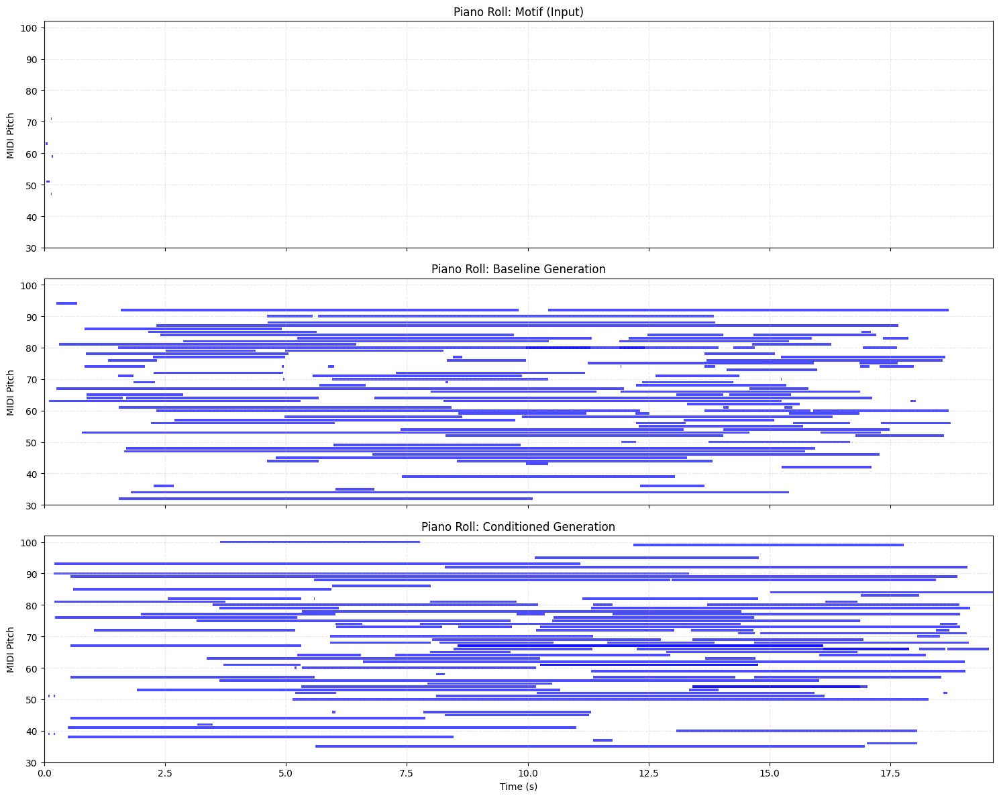

In [ ]:
import pretty_midi
import matplotlib.pyplot as plt
import numpy as np
import os

def plot_midi_piano_roll(midi_files, titles):
    """Generates and displays piano roll visualizations with consistent scaling."""
    all_notes = []
    midi_data = []

    # Load all files first to find global limits
    for path in midi_files:
        try:
            pm = pretty_midi.PrettyMIDI(path)
            notes = []
            for inst in pm.instruments:
                if not inst.is_drum:
                    notes.extend(inst.notes)
            midi_data.append(notes)
            all_notes.extend(notes)
        except Exception as e:
            print(f"Error loading {path}: {e}")
            midi_data.append([])

    if not all_notes:
        print("No notes found to plot.")
        return

    # Calculate global limits
    min_pitch = min(n.pitch for n in all_notes) - 2
    max_pitch = max(n.pitch for n in all_notes) + 2
    max_time = max(n.end for n in all_notes)

    # Create plots
    fig, axes = plt.subplots(len(midi_files), 1, figsize=(15, 4 * len(midi_files)), sharex=True)
    if len(midi_files) == 1: axes = [axes]

    for i, (notes, title) in enumerate(zip(midi_data, titles)):
        ax = axes[i]
        for note in notes:
            ax.barh(note.pitch, note.end - note.start, left=note.start,
                    height=0.8, align='center', color='blue', alpha=0.7)

        ax.set_title(title)
        ax.set_ylabel("MIDI Pitch")
        ax.set_ylim(min_pitch, max_pitch)
        ax.set_xlim(0, max_time)
        ax.grid(True, axis='both', linestyle='--', alpha=0.3)

    plt.xlabel("Time (s)")
    plt.tight_layout()
    plt.show()

# Plot the generated MIDI files with shared scales
files = ["output_motif.mid", "output_baseline.mid", "output_conditioned.mid"]
titles = ["Piano Roll: Motif (Input)", "Piano Roll: Baseline Generation", "Piano Roll: Conditioned Generation"]
plot_midi_piano_roll(files, titles)

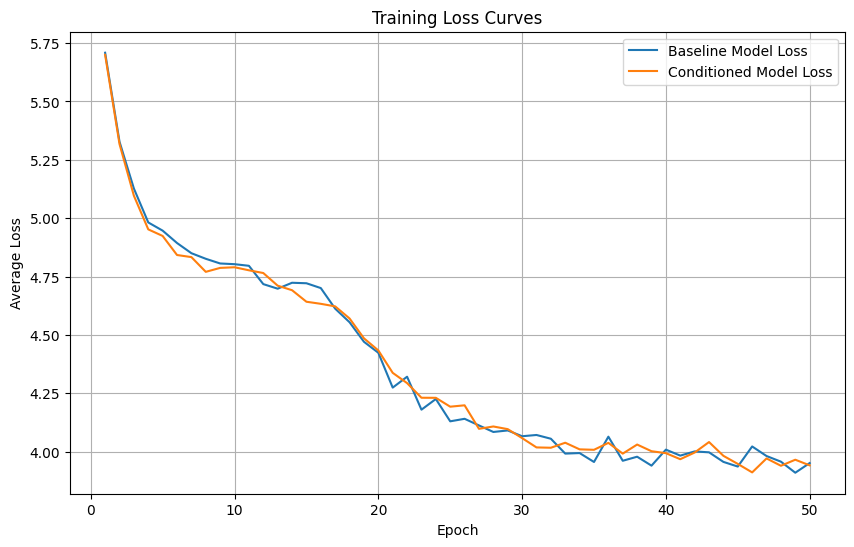


--- Classification Metrics (Final Training Losses) ---
| Model       |   Final Training Loss |
|:------------|----------------------:|
| Baseline    |                3.9509 |
| Conditioned |                3.941  |


In [ ]:
import matplotlib.pyplot as plt
import re
import pandas as pd


baseline_losses = []
conditioned_losses = []
current_model = None

if 'training_output' in globals():
    for line in training_output.splitlines():
        if ">>> Training BASELINE Model" in line:
            current_model = "baseline"
        elif ">>> Training CONDITIONED Model" in line:
            current_model = "conditioned"

        match = re.search(r"Epoch \d+ Avg Loss: (\d+\.\d+)", line)
        if match and current_model:
            loss = float(match.group(1))
            if current_model == "baseline":
                baseline_losses.append(loss)
            elif current_model == "conditioned":
                conditioned_losses.append(loss)
else:
    print("Error: 'training_output' not found. Please ensure the training cell has been executed.")


if baseline_losses or conditioned_losses:
    epochs = range(1, len(baseline_losses) + 1)
    plt.figure(figsize=(10, 6))
    if baseline_losses:
        plt.plot(epochs, baseline_losses, label='Baseline Model Loss')
    if conditioned_losses:
        plt.plot(range(1, len(conditioned_losses) + 1), conditioned_losses, label='Conditioned Model Loss')

    plt.xlabel('Epoch')
    plt.ylabel('Average Loss')
    plt.title('Training Loss Curves')
    plt.legend()
    plt.grid(True)
    plt.show()


print("\n--- Classification Metrics (Final Training Losses) ---")
if baseline_losses and conditioned_losses:
    data = {
        'Model': ['Baseline', 'Conditioned'],
        'Final Training Loss': [baseline_losses[-1], conditioned_losses[-1]]
    }
    df = pd.DataFrame(data)
    print(df.to_markdown(index=False))
else:
    print("Could not extract final losses. Please check the training output.")